# 1.1 Подготовка и анализ изначальных данных

## Импортирование библиотек

In [ ]:
# для визуализации
import matplotlib.pyplot as plt 
%matplotlib inline

# для работы с файлами
import os

# для более удобных словарей
from collections import defaultdict

# проверка версий
print('matplotlib version: 3.10.0')

## Анализ данных

назначаем пути которые нам нужны

для удобства, я создал двумерный список для оперирования разными датасетами

In [125]:
def get_path(part: str = 'test', data: str = 'images') -> str:
    '''функция для получения путя к данным'''
    
    return fr'D:\Helper\MLBazyak\homework\06_01\06_01_hw\data\{part}\{data}'

# части данных
dp = [
      ['test', 'images', 'labels', 'labels_rw'],
      ['train', 'images', 'labels', 'labels_rw'],
      ['valid', 'images', 'labels', 'labels_rw'],
      ['start_labels', 'labels_test', 'labels_train', 'labels_valid']
      ]

In [126]:
# тестирование функции get_path()
print(get_path())
print(get_path(dp[0][0], dp[0][1]))
# успешно

D:\Helper\MLBazyak\homework\06_01\06_01_hw\data\test\images
D:\Helper\MLBazyak\homework\06_01\06_01_hw\data\test\images


изучаем распределение классов в данных

In [ ]:
colors = ['#0f1d87', '#0a64f7', '#6abee6']         # назначаю цвета

fig, axes = plt.subplots(1,3, figsize=(15,5))      # инициализирую кол-во графиков и общий размер
fig.suptitle('Class distribution in folders')

for i in range(3):                                 # прохожу по каждому датасету списком
    label_dir = get_path(dp[3][0], dp[3][i+1])
    class_stats = defaultdict(int)
    for label_file in os.listdir(label_dir):
        with open(os.path.join(label_dir, label_file), 'r') as f:
            lines = f.readlines()
            for line in lines:
                class_id = int(line.split()[0])
                class_stats[class_id] += 1

    print(f'Class statistics in the folder {dp[i][0]}:')      # вывожу статистику по классам
    for class_id, count in class_stats.items():
        print(f'Class {class_id}: {count} objects')
    print('-----------------------------------------')

    axes[i].bar(class_stats.keys(), class_stats.values(), color=colors[i])  # добавляю часть графика
    axes[i].set_title(f'Folder {dp[i][0]}')                                 # название датасета
    axes[i].set_xlabel('Class ID')                                          # подпись x
    axes[i].set_ylabel('Number of input')                                   # подпись y
    axes[i].set_xticks(list(class_stats.keys()))                

plt.tight_layout()
plt.show()

**после исследования классов в YAT, я могу сказать что:**

- 0 - название продукта  |
- 1 - цена без скидки    | 
- 2 - актуальная цена    | *<=== я должен научить модель находить на фото эти классы*
- 3 - вид скидки

*у меня нет надобности увеличивать размеры классов (я так думаю)*

**Для того чтобы модель лучше научилась определять цеу продукта, удалю все остальные классы в разметке, оставляя только `актуальную цену`**

In [ ]:
start_lbl = ['labels_test', 'labels_train', 'labels_valid']                     # названия папок со старыми разметками

for i in range(3):
    label_dir = fr'D:\Helper\MLBazyak\homework\06_01\06_01_hw\data\start_labels\{start_lbl[i]}'  # используя f строку инициализирую полный путь к папке
    label_rw_dir = get_path(dp[i][0], dp[1][2])        # путь к обновленному файлу
    processed = 0
    for filename in os.listdir(label_dir):                              # прохожусь по каждому файлу
        filepath = os.path.join(label_dir, filename)
        new_filepath = os.path.join(label_rw_dir, filename)           # создаю новый путь файла

        with open(filepath, 'r') as f:
            lines = f.readlines()

        filtered_lines = []
        for line in lines:                                        # прохожусь по строчкам в файле
            parts = line.strip().split()                          # сплитую строчку по пробелам
            if parts and parts[0] == '2':                         # если строка есть, и начинается с '2' то:
                parts[0] = '0'                                    # заменяю 2 на 0
                updated_line = ' '.join(parts) + '\n'             # собираю строку заново
                filtered_lines.append(updated_line)               # собираю файл заново
        
        with open(new_filepath, 'w') as f:                        # сохраняю новый файл с разметкой по 1 классу с ценой
            f.writelines(filtered_lines)                  
        
        processed+=1
    
    print(f'Processing complete for {start_lbl[i]}.')
    print(f'Updated markups are saved in the {label_rw_dir} folder.')
    print(f'Processed files: {processed}')
    print('-----------------------------------------')


**Используя YAT, я доразметил и переразметил данные, корректируя и дополняя их**

*данные изначально были разделены на тестовый, тренировочный и валидационный датасеты, и их я буду использовать для обучения модели*

# 1.2 Подбор алгоритма обучения

## Архитектура модели

**YOLOv8n** (3.2M)

- task=detect 
- mode=train 
- model=yolov8n.pt 
- data=D:\Helper\MLBazyak\homework\06_01\06_01_hw\data.yaml 
- epochs=3 
- time=None 
- patience=100 
- batch=8 
- imgsz=640 
- save=True 
- save_period=-1 
- cache=False 
- device=None 
- workers=8 
- project=None 
- name=price_detection_v3 
- exist_ok=False 
- pretrained=True 
- optimizer=auto 
- verbose=True 
- seed=0 
- deterministic=True 
- single_cls=False 
- rect=False 
- cos_lr=True 
- close_mosaic=10 
- resume=False 
- amp=True 
- fraction=1.0 
- profile=False 
- freeze=None 
- multi_scale=False 
- overlap_mask=True 
- mask_ratio=4 
- dropout=0.0 
- val=True 
- split=val 
- save_json=False 
- save_hybrid=False 
- conf=None  
- iou=0.7 
- max_det=300 
- half=False 
- dnn=False 
- plots=True 
- source=None 
- vid_stride=1 
- stream_buffer=False 
- visualize=False 
- augment=False 
- agnostic_nms=False 
- classes=None 
- retina_masks=False 
- embed=None 
- show=False 
- save_frames=False 
- save_txt=False 
- save_conf=False 
- save_crop=False 
- show_labels=True 
- show_conf=True 
- show_boxes=True 
- line_width=None 
- format=torchscript 
- keras=False 
- optimize=False 
- int8=False 
- dynamic=False 
- simplify=True 
- opset=None 
- workspace=None 
- nms=False 
- lr0=0.01 
- lrf=0.01 
- momentum=0.937 
- weight_decay=0.0005 
- warmup_epochs=3.0 
- warmup_momentum=0.8 
- warmup_bias_lr=0.1 
- box=7.5 
- cls=0.5 
- dfl=1.5 
- pose=12.0 
- kobj=1.0 
- nbs=64 
- hsv_h=0.015 
- hsv_s=0.7 
- hsv_v=0.4 
- degrees=0.0 
- translate=0.1 
- scale=0.5 
- shear=0.0 
- perspective=0.0 
- flipud=0.0 
- fliplr=0.5 
- bgr=0.0 
- mosaic=1.0 
- mixup=0.0 
- copy_paste=0.0 
- copy_paste_mode=flip 
- auto_augment=randaugment 
- erasing=0.4 
- crop_fraction=1.0 
- cfg=None 
- tracker=botsort.yaml 
- save_dir=runs\detect\price_detection_v3

**Я буду использовать эту версию YOLO, тк она хорошо справляется с задачами детекции, а также не сильно требовательная к ресурсам**

*Гиперпараметры, которые я настроил:*
- `data = r'D:\Helper\MLBazyak\homework\06_01\06_01_hw\data.yaml'` | путь к yaml файлу
- `epochs=3`                                                       | количество эпох
- `imgsz=640`                                                      | размер изображений в данных
- `batch=8`                                                        | количество батчей
- `cos_lr=True`                                                    | косинусный планировщик кривой скорости обучении
- `lr0=0.01`                                                       | скорость обучения

##

# 1.3 Импорт данных для обучения нейронной сети

## Импортирование библиотек

In [1]:
# импортируем модуль с YOLO
from ultralytics import YOLO 

# библиотека для работы с изображениями
from PIL import Image        

# версии библиотек (указаны в requirements.txt файле)
print('ultralytics version:', '8.3.58')
print('PIL version:', '11.1.0')

ultralytics version: 8.3.58
PIL version: 11.1.0


я загрузил данные в следующую структуру:

- ---> `data/`
- ------> `test/`
- ---------> `images/`
- ---------> `labels/`
- ------> `train/`
- ---------> `images/`
- ---------> `labels/`
- ------> `valid/`
- ---------> `images/`
- ---------> `labels/`

# 1.4 Обучение нейронной сети

## Тесты

*тестирование YOLO модели*

In [2]:
model = YOLO('yolov8n.pt') # инициализируем модель YOLOv8 nano

In [ ]:
# тестовое обучение
results_test = model.train(
    data = r'D:\Helper\MLBazyak\homework\06_01\06_01_hw\data.yaml',  # путь к yaml файлу
    epochs=3,                                                        # количество эпох
    imgsz=640,                                                       # размер изображений в данных
    batch=8,                                                         # количество батчей
    cos_lr=True,                                                     # косинусный планировщик кривой скорости обучении
    lr0=0.01,                                                        # скорость обучения
    name='price_detection_v3'                                        # название эксперимента
)

In [ ]:
# инициализация тестовых результатов
result_test = model(r'D:\Helper\MLBazyak\homework\06_01\price_detection\data\test\images\original_five_33_v3_jpg.rf.9e8bde5a93c18446991a3e0f37ef0c76.jpg')

for result in result_test:
    img = result.plot()  
    img = Image.fromarray(img)  
    img.show()           

Для 3 эпох, вполне себе достойный результат:

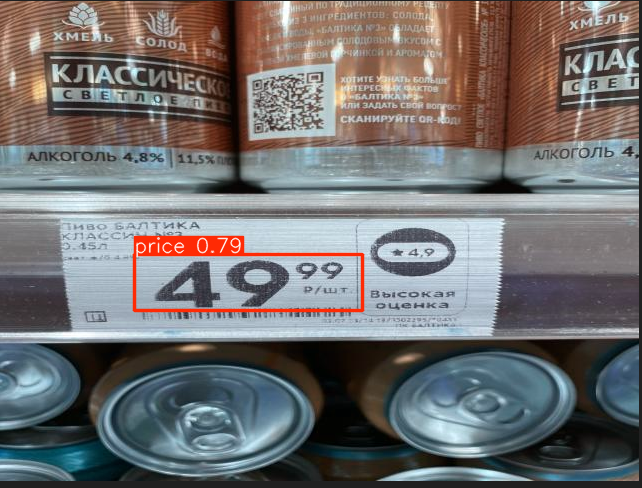

In [ ]:
# валидация модели
model.val()

## Обучение модели

In [4]:
model = YOLO(r'D:\Helper\MLBazyak\homework\06_01\06_01_hw\runs\detect\price_detection_v3\weights\best.pt') # загружаю модель

In [6]:
# инициализация финальных результатов
results = model.train(
    data = r'D:\Helper\MLBazyak\homework\06_01\06_01_hw\data.yaml',
    epochs=10,
    imgsz=640,
    batch=8,
    cos_lr=True,
    lr0=0.01,
    name='price_detection_v4')

Ultralytics 8.3.61  Python-3.11.9 torch-2.5.1+cpu CPU (11th Gen Intel Core(TM) i5-1135G7 2.40GHz)
engine\trainer: task=detect, mode=train, model=D:\Helper\MLBazyak\homework\06_01\06_01_hw\runs\detect\price_detection_v3\weights\best.pt, data=D:\Helper\MLBazyak\homework\06_01\06_01_hw\data.yaml, epochs=10, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=price_detection_v42, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embe

train: Scanning D:\Helper\MLBazyak\homework\06_01\06_01_hw\data\train\labels.cache... 914 images, 0 backgrounds, 0 corrupt: 100%|██████████| 914/914 [00:00<?, ?it/s]
val: Scanning D:\Helper\MLBazyak\homework\06_01\06_01_hw\data\valid\labels.cache... 261 images, 0 backgrounds, 0 corrupt: 100%|██████████| 261/261 [00:00<?, ?it/s]

Plotting labels to runs\detect\price_detection_v42\labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\detect\price_detection_v42
Starting training for 10 epochs...
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10         0G       1.29      1.055      1.261          2        640: 100%|██████████| 115/115 [12:00<00:00,  6.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:55<00:00,  3.26s/it]


                   all        261        308      0.976      0.935      0.985       0.55

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10         0G      1.446      1.069      1.376          3        640: 100%|██████████| 115/115 [12:12<00:00,  6.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [01:08<00:00,  4.02s/it]

                   all        261        308      0.929      0.935      0.982      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10         0G      1.413     0.9695      1.334          2        640: 100%|██████████| 115/115 [12:27<00:00,  6.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:58<00:00,  3.42s/it]

                   all        261        308      0.902      0.922      0.963      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10         0G      1.397      0.869      1.341          3        640: 100%|██████████| 115/115 [10:38<00:00,  5.55s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:57<00:00,  3.41s/it]

                   all        261        308      0.974      0.982      0.991      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10         0G      1.385     0.8031      1.341          2        640: 100%|██████████| 115/115 [10:46<00:00,  5.62s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:57<00:00,  3.39s/it]

                   all        261        308      0.975      0.977      0.993      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10         0G      1.343     0.7087      1.318          3        640: 100%|██████████| 115/115 [09:16<00:00,  4.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:39<00:00,  2.31s/it]

                   all        261        308      0.952      0.987       0.99      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10         0G      1.334     0.6755      1.306          2        640: 100%|██████████| 115/115 [08:00<00:00,  4.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:38<00:00,  2.27s/it]

                   all        261        308      0.981      0.987      0.994      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10         0G      1.304     0.6428      1.273          2        640: 100%|██████████| 115/115 [08:00<00:00,  4.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:38<00:00,  2.29s/it]

                   all        261        308       0.98       0.99      0.993      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10         0G      1.275     0.6027      1.259          2        640: 100%|██████████| 115/115 [08:00<00:00,  4.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:38<00:00,  2.26s/it]

                   all        261        308      0.977      0.994      0.993      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10         0G      1.273     0.5916      1.257          2        640: 100%|██████████| 115/115 [08:00<00:00,  4.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:38<00:00,  2.29s/it]

                   all        261        308      0.981       0.99      0.994      0.643



10 epochs completed in 1.796 hours.
Optimizer stripped from runs\detect\price_detection_v42\weights\last.pt, 6.2MB
Optimizer stripped from runs\detect\price_detection_v42\weights\best.pt, 6.2MB

Validating runs\detect\price_detection_v42\weights\best.pt...
Ultralytics 8.3.61  Python-3.11.9 torch-2.5.1+cpu CPU (11th Gen Intel Core(TM) i5-1135G7 2.40GHz)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:32<00:00,  1.92s/it]


                   all        261        308      0.981       0.99      0.994      0.642
Speed: 1.8ms preprocess, 109.2ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs\detect\price_detection_v42


*несколько тренировочных батчей*

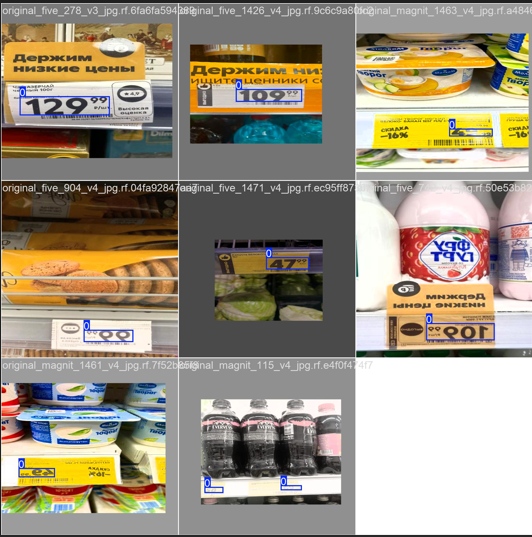
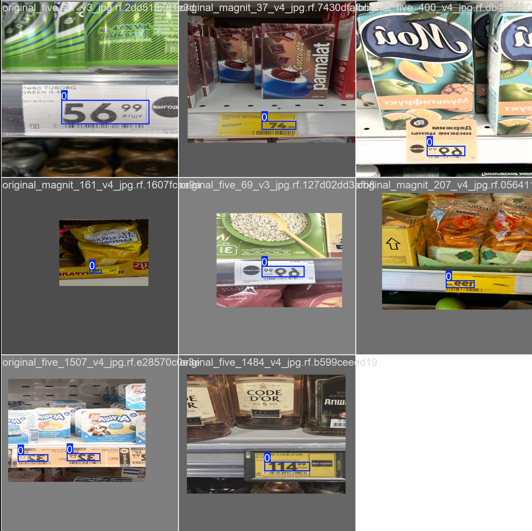

In [7]:
model.val()

Ultralytics 8.3.61  Python-3.11.9 torch-2.5.1+cpu CPU (11th Gen Intel Core(TM) i5-1135G7 2.40GHz)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning D:\Helper\MLBazyak\homework\06_01\06_01_hw\data\valid\labels.cache... 261 images, 0 backgrounds, 0 corrupt: 100%|██████████| 261/261 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [01:02<00:00,  1.89s/it]


                   all        261        308      0.981       0.99      0.994      0.642
Speed: 4.7ms preprocess, 189.6ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs\detect\price_detection_v422


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001BAD7950B90>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.0480

## Проверка

In [127]:
photos = [r'D:\Helper\MLBazyak\homework\06_01\06_01_hw\data\test\images\original_five_237_v4_jpg.rf.ea11992f01fc8a1a9d3e8fa1891c6f98.jpg',
          r'D:\Helper\MLBazyak\homework\06_01\06_01_hw\test2.jpg',
          r'D:\Helper\MLBazyak\homework\06_01\06_01_hw\data\test\images\original_five_1381_v4_jpg.rf.f83985d20e2111de4666d99b99083109.jpg',
          r'D:\Helper\MLBazyak\homework\06_01\06_01_hw\data\test\images\original_magnit_179_v4_jpg.rf.d83b2ab287821a7b6f6f1c8e1927696e.jpg',
          r'D:\Helper\MLBazyak\homework\06_01\06_01_hw\test1.png']
for photo in photos:
    result_fin = model(photo)
    for result in result_fin:
        img = result.plot()  
        img = Image.fromarray(img)  
        img.show()  


image 1/1 D:\Helper\MLBazyak\homework\06_01\06_01_hw\data\test\images\original_five_237_v4_jpg.rf.ea11992f01fc8a1a9d3e8fa1891c6f98.jpg: 480x640 1 price, 78.8ms
Speed: 3.0ms preprocess, 78.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 D:\Helper\MLBazyak\homework\06_01\06_01_hw\test2.jpg: 640x576 1 price, 134.2ms
Speed: 3.6ms preprocess, 134.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 576)

image 1/1 D:\Helper\MLBazyak\homework\06_01\06_01_hw\data\test\images\original_five_1381_v4_jpg.rf.f83985d20e2111de4666d99b99083109.jpg: 480x640 4 prices, 84.9ms
Speed: 2.0ms preprocess, 84.9ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 D:\Helper\MLBazyak\homework\06_01\06_01_hw\data\test\images\original_magnit_179_v4_jpg.rf.d83b2ab287821a7b6f6f1c8e1927696e.jpg: 480x640 1 price, 156.1ms
Speed: 2.2ms preprocess, 156.1ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 D:\Helper\MLBazyak\ho

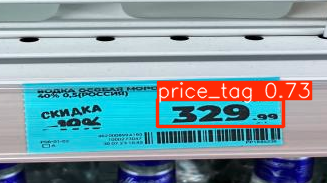
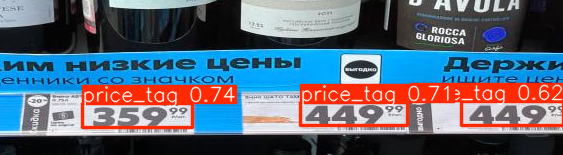
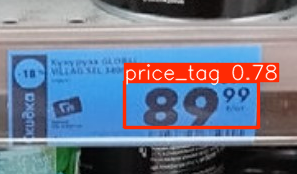
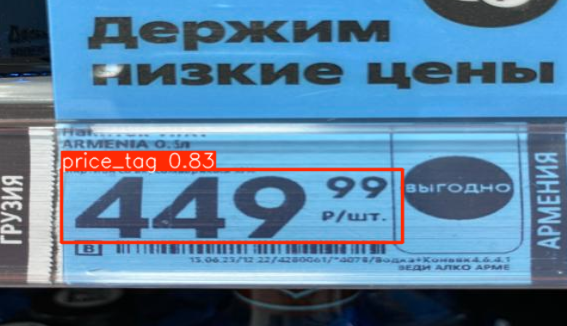
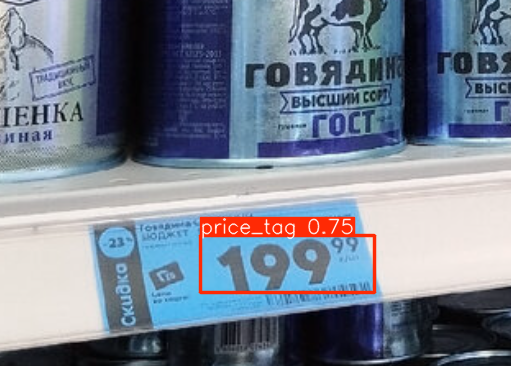

*я сделал несколько фотографий ценников в местной Пятерочке, для проверки на них модели (фото 3 & 5)*

## OCR

*Я использовал Tesseract и EasyOCR не так давно для пет проекта, и если*

*я могу доверять информации из **Интернета**, EasyOCR быстрый и более новый OCR инструмент*


### Импортирование библиотек

In [ ]:
import easyocr

print(f'EasyOCR version: {easyocr.__version__}')

In [ ]:
ocr = easyocr.Reader(['en']) # инициализирую OCR модель (english немного лучше распознает цифры)

## Объединяю 2 модели

### Импортирование библиотек

In [ ]:
# библиотека для работы с фото
import cv2
# библиотека с регулярными выражениями
import re

print('opencv-python version:', cv2.__version__)

### Создание функций

**Для завершения этого модуля, я думаю нужно:**
- найти bb's для картинки
- обрезать картинку по bb's
- в обрезанной картинке распознать текст используя OCR модель

*может быть я буду использовать рег. выражения для структурирования вывода*

~~*пути*~~

In [ ]:
model = YOLO(r'D:\Helper\MLBazyak\homework\06_01\06_01_hw\runs\detect\price_detection_v3\weights\best.pt')  # загружаю свою модель
img = r'D:\Helper\MLBazyak\homework\06_01\06_01_hw\test2.jpg'                                               # путь к фотографии

In [ ]:
model.val()

In [123]:
def rec_price(det_model: YOLO = model, 
              ocr: easyocr.Reader = ocr, 
              img_dir: str = img):
    
    '''
        Процедура для обнаружения и распознавания цен на изображении.

    Args:
        - det_model (YOLO): Модель YOLO для обнаружения bounding box'ов цен.
        - ocr (easyocr.Reader): Модель OCR для распознавания текста.
        - img_dir (str): Путь к изображению, на котором нужно найти цену.

    Returns:
        list: Функция отображает изображение с обнаруженными ценами и возвращает список с определенными ценами
    '''    

    image = cv2.imread(img_dir)
    res = det_model(image)
    
    image_ocr = cv2.imread(img_dir, cv2.IMREAD_GRAYSCALE)
    _, binary_image = cv2.threshold(image_ocr, 100, 255, cv2.THRESH_BINARY)


    image_ocr = cv2.equalizeHist(binary_image)

    prices = []

    for result in res:
        boxes = result.boxes.xyxy.cpu().numpy()
        for box in boxes:
            x1, y1, x2, y2 = map(int, box)
            correct = (x2-x1)*0.28
            print(correct)
            x2 = int(x2-correct)
            crop = image_ocr[y1:y2, x1:x2]

            # --------------------------------------------

            # plt.figure(figsize=(5, 5))
            # plt.imshow(crop, cmap='gray')
            # plt.title("Cropped Image")               # отображение обрезанной части картинки
            # plt.axis('off')
            # plt.show()

            # --------------------------------------------

            ocr_res = ocr.readtext(crop, allowlist='0123456789')

            price = None 

            for detection in ocr_res:
                price = detection[1]
                confidence = detection[2]

                match = re.search(r'\d+[\.,]?\d*', price)

                if match:
                    price = match.group()
                    print(f'Price: {price}\nConfidence: {confidence:.2f}')
                    break
            if price is not None:
                cv2.rectangle(image, (x1,y1), (x2+int(correct),y2), (255, 97, 0), 2)  # выделение изначального бокса
                cv2.rectangle(image, (x1,y1), (x2,y2), (97, 255, 0), 2)     # выделение инпута в ocr
                cv2.putText(image, price + 'rub', (x1,y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 97, 0), 2)
                prices.append(price)

    img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    pil_img = Image.fromarray(img_rgb)
    pil_img.show() 

    return prices

**Тестирование моей функции**

*(Я специально оставил фотографии, где все работает не идеально, чтобы вы могли увидеть, над чем можно поработать)*

In [128]:
photos = [r'D:\Helper\MLBazyak\homework\06_01\06_01_hw\data\test\images\original_five_237_v4_jpg.rf.ea11992f01fc8a1a9d3e8fa1891c6f98.jpg',
          r'D:\Helper\MLBazyak\homework\06_01\06_01_hw\data\test\images\original_magnit_982_v4_jpg.rf.da3cb4317478a837da79b6a3f7512d0a.jpg',
          r'D:\Helper\MLBazyak\homework\06_01\06_01_hw\data\test\images\original_magnit_65_v4_jpg.rf.756fc91f6651425b06f55aaa81510428.jpg',
          r'D:\Helper\MLBazyak\homework\06_01\06_01_hw\test2.jpg',
          r'D:\Helper\MLBazyak\homework\06_01\06_01_hw\data\test\images\original_five_1381_v4_jpg.rf.f83985d20e2111de4666d99b99083109.jpg',
          r'D:\Helper\MLBazyak\homework\06_01\06_01_hw\data\test\images\original_magnit_179_v4_jpg.rf.d83b2ab287821a7b6f6f1c8e1927696e.jpg',
          r'D:\Helper\MLBazyak\homework\06_01\06_01_hw\test1.png']

for photo in photos:
    rec_price(img_dir=photo)
    print('--------------------------------')



0: 480x640 1 price, 92.8ms
Speed: 4.7ms preprocess, 92.8ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)
94.36000000000001
Price: 449
Confidence: 1.00
--------------------------------

0: 480x640 2 prices, 84.1ms
Speed: 2.7ms preprocess, 84.1ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 640)
38.92
Price: 64
Confidence: 1.00
37.800000000000004
--------------------------------

0: 480x640 4 prices, 68.4ms
Speed: 1.0ms preprocess, 68.4ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)
17.360000000000003
13.440000000000001
16.520000000000003
17.080000000000002
--------------------------------

0: 640x576 1 price, 1102.7ms
Speed: 28.5ms preprocess, 1102.7ms inference, 28.6ms postprocess per image at shape (1, 3, 640, 576)
37.52
Price: 89
Confidence: 1.00
--------------------------------

0: 480x640 4 prices, 130.2ms
Speed: 2.5ms preprocess, 130.2ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)
28.000000000000004
30.240

**Результаты:**

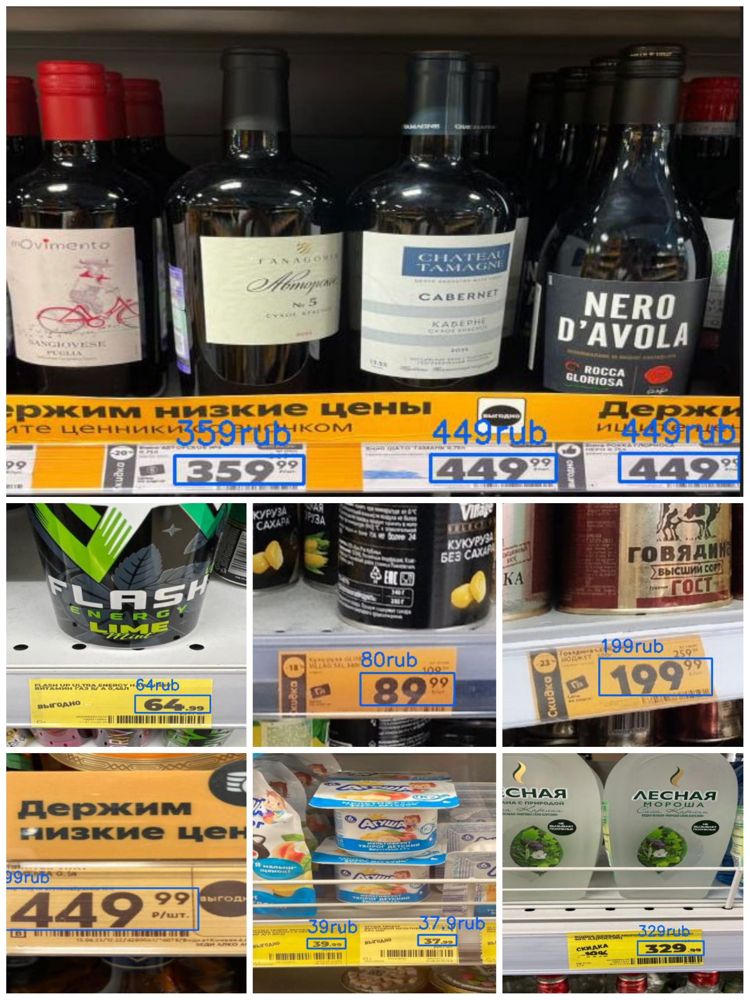


*Я думаю, что это более чем релевантный результат*

**как это работает???**

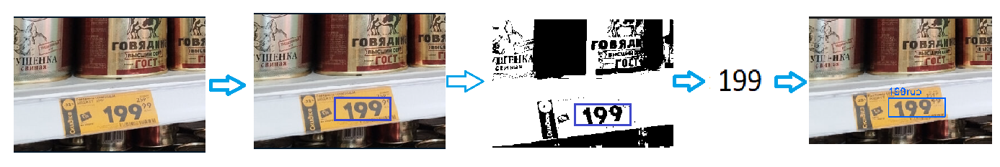

### Заключение

`Как результат модуля, я поработал с YOLO и OCR моделями и научился как использовать эти инструменты для поиска и распознавания цены с изображения`

## Рефлексия

- если вы лучше работаете с данными, вы можете более точно выделить bb с ценой продукта
- можно попробовать использовать более точные и ресурсоемкие модели OCR (например, TrOCR) для более точного распознавания цены
- можно не удалять класс с названием товара, чтобы отображать его название в дополнение к цене

### фани моментс

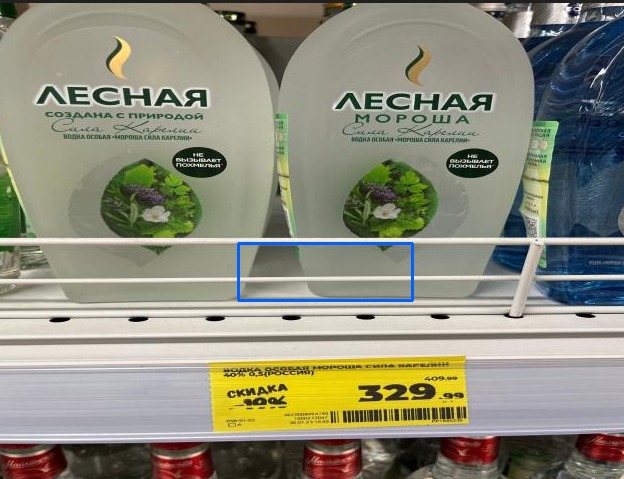

**?? _????;**

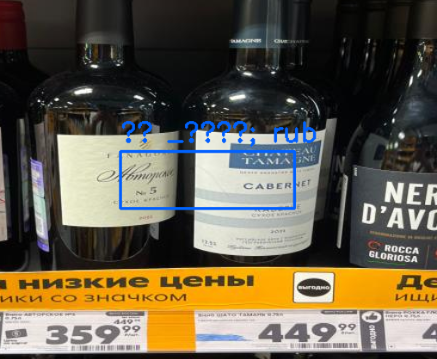

**almost**

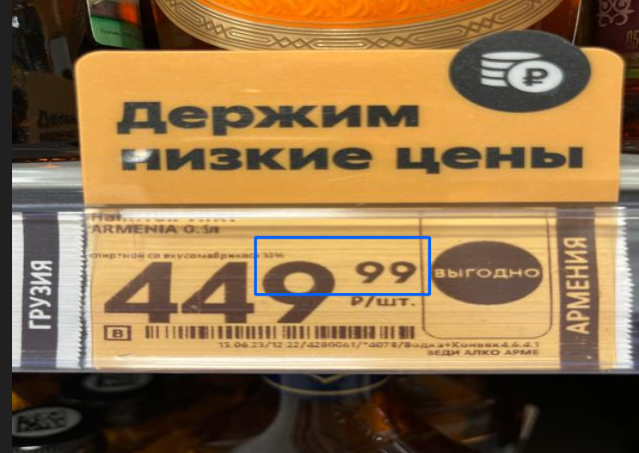

**not that yo**

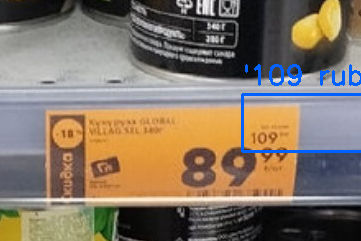